In [78]:
#import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as pe
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
from scipy.cluster import hierarchy
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import normalize
from sklearn.decomposition import PCA
from sklearn.metrics import classification_report
sns.set_theme(style='darkgrid')
plt.rcParams['figure.figsize'] = (10,5)
plt.rcParams['figure.dpi'] = 250
sns.set_style('darkgrid')
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [2]:
wine = pd.read_csv(r"C:\Users\shree\Desktop\subject\Data_Science\DS_Assignments\Datasets\wine.csv")

In [3]:
wine.shape

(178, 14)

In [4]:
wine.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 178 entries, 0 to 177
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Type             178 non-null    int64  
 1   Alcohol          178 non-null    float64
 2   Malic            178 non-null    float64
 3   Ash              178 non-null    float64
 4   Alcalinity       178 non-null    float64
 5   Magnesium        178 non-null    int64  
 6   Phenols          178 non-null    float64
 7   Flavanoids       178 non-null    float64
 8   Nonflavanoids    178 non-null    float64
 9   Proanthocyanins  178 non-null    float64
 10  Color            178 non-null    float64
 11  Hue              178 non-null    float64
 12  Dilution         178 non-null    float64
 13  Proline          178 non-null    int64  
dtypes: float64(11), int64(3)
memory usage: 19.6 KB


In [5]:
wine.isnull().sum()

Type               0
Alcohol            0
Malic              0
Ash                0
Alcalinity         0
Magnesium          0
Phenols            0
Flavanoids         0
Nonflavanoids      0
Proanthocyanins    0
Color              0
Hue                0
Dilution           0
Proline            0
dtype: int64

In [6]:
wine.duplicated().value_counts()

False    178
dtype: int64

In [7]:
wine.head()

,Type,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline
0,1,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065
1,1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050
2,1,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185
3,1,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480
4,1,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735


## Descriptive Statictics

In [8]:
wine.corr()

,Type,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline
Type,1.000000,-0.328222,0.437776,-0.049643,0.517859,-0.209179,-0.719163,-0.847498,0.489109,-0.499130,0.265668,-0.617369,-0.788230,-0.633717
Alcohol,-0.328222,1.000000,0.094397,0.211545,-0.310235,0.270798,0.289101,0.236815,-0.155929,0.136698,0.546364,-0.071747,0.072343,0.643720
Malic,0.437776,0.094397,1.000000,0.164045,0.288500,-0.054575,-0.335167,-0.411007,0.292977,-0.220746,0.248985,-0.561296,-0.368710,-0.192011
Ash,-0.049643,0.211545,0.164045,1.000000,0.443367,0.286587,0.128980,0.115077,0.186230,0.009652,0.258887,-0.074667,0.003911,0.223626
Alcalinity,0.517859,-0.310235,0.288500,0.443367,1.000000,-0.083333,-0.321113,-0.351370,0.361922,-0.197327,0.018732,-0.273955,-0.276769,-0.440597
Magnesium,-0.209179,0.270798,-0.054575,0.286587,-0.083333,1.000000,0.214401,0.195784,-0.256294,0.236441,0.199950,0.055398,0.066004,0.393351
Phenols,-0.719163,0.289101,-0.335167,0.128980,-0.321113,0.214401,1.000000,0.864564,-0.449935,0.612413,-0.055136,0.433681,0.699949,0.498115
Flavanoids,-0.847498,0.236815,-0.411007,0.115077,-0.351370,0.195784,0.864564,1.000000,-0.537900,0.652692,-0.172379,0.543479,0.787194,0.494193
Nonflavanoids,0.489109,-0.155929,0.292977,0.186230,0.361922,-0.256294,-0.449935,-0.537900,1.000000,-0.365845,0.139057,-0.262640,-0.503270,-0.311385
Proanthocyanins,-0.499130,0.136698,-0.220746,0.009652,-0.197327,0.236441,0.612413,0.652692,-0.365845,1.000000,-0.025250,0.295544,0.519067,0.330417


<Axes: >

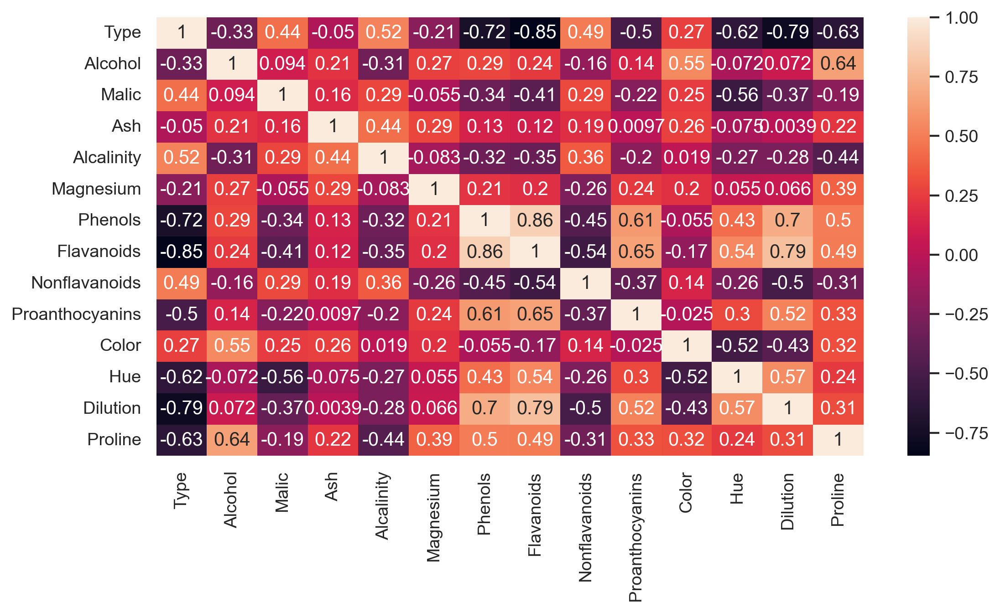

In [9]:
sns.heatmap(wine.corr(),annot = True)

In [10]:
wine.describe()

,Type,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline
count,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000
mean,1.938202,13.000618,2.336348,2.366517,19.494944,99.741573,2.295112,2.029270,0.361854,1.590899,5.058090,0.957449,2.611685,746.893258
std,0.775035,0.811827,1.117146,0.274344,3.339564,14.282484,0.625851,0.998859,0.124453,0.572359,2.318286,0.228572,0.709990,314.907474
min,1.000000,11.030000,0.740000,1.360000,10.600000,70.000000,0.980000,0.340000,0.130000,0.410000,1.280000,0.480000,1.270000,278.000000
25%,1.000000,12.362500,1.602500,2.210000,17.200000,88.000000,1.742500,1.205000,0.270000,1.250000,3.220000,0.782500,1.937500,500.500000
50%,2.000000,13.050000,1.865000,2.360000,19.500000,98.000000,2.355000,2.135000,0.340000,1.555000,4.690000,0.965000,2.780000,673.500000
75%,3.000000,13.677500,3.082500,2.557500,21.500000,107.000000,2.800000,2.875000,0.437500,1.950000,6.200000,1.120000,3.170000,985.000000
max,3.000000,14.830000,5.800000,3.230000,30.000000,162.000000,3.880000,5.080000,0.660000,3.580000,13.000000,1.710000,4.000000,1680.000000


In [11]:
sns.pairplot(wine)

### Outlier Removal


{'whiskers': [<matplotlib.lines.Line2D at 0x2087116fa00>,
 'caps': [<matplotlib.lines.Line2D at 0x2087116ff40>,
 'boxes': [<matplotlib.lines.Line2D at 0x2087116f7c0>,
 'medians': [<matplotlib.lines.Line2D at 0x208711404c0>,
 'fliers': [<matplotlib.lines.Line2D at 0x20871140760>,
 'means': []}

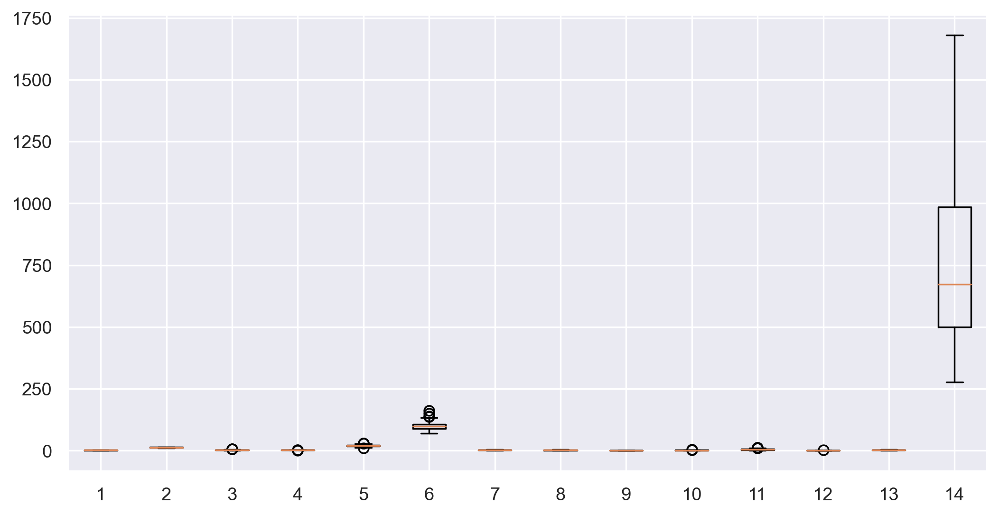

In [12]:
plt.boxplot(wine)

In [13]:
def outlier_cap(df,column):
    for index, row in df.iterrows():
        h = df[column].quantile(0.75)
        l = df[column].quantile(0.25)
        IQR = h - l
        upper_threshold = h + 1.5*IQR
        lower_threshold = l - 1.5*IQR
        if row[column] > upper_threshold:
            df.at[index, column] = upper_threshold
        elif row[column] < lower_threshold:
            df.at[index, column] = lower_threshold

In [14]:
for i in wine:
    outlier_cap(wine,i)

{'whiskers': [<matplotlib.lines.Line2D at 0x20823e378b0>,
 'caps': [<matplotlib.lines.Line2D at 0x20823e37df0>,
 'boxes': [<matplotlib.lines.Line2D at 0x20823e37610>,
 'medians': [<matplotlib.lines.Line2D at 0x20823e70370>,
 'fliers': [<matplotlib.lines.Line2D at 0x20823e70610>,
 'means': []}

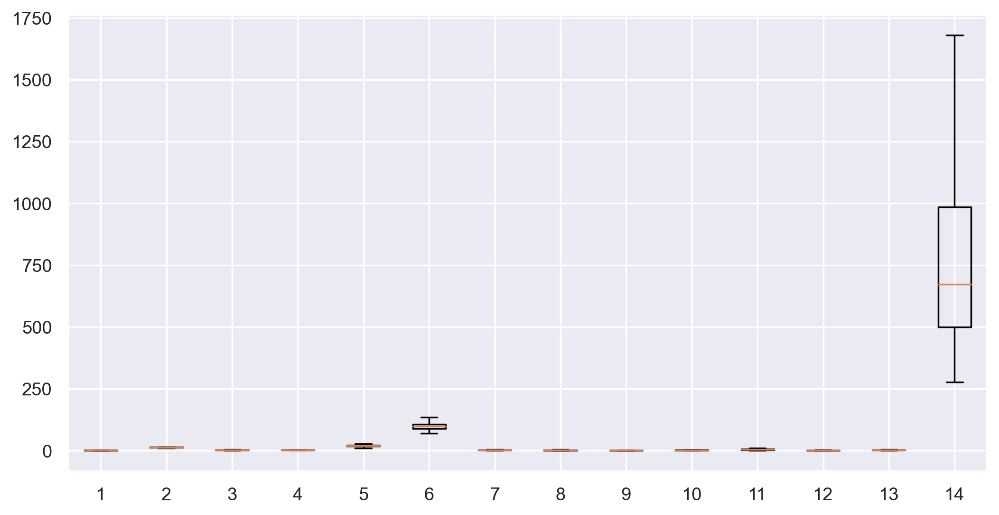

In [15]:
plt.boxplot(wine)

### Feature Engineering

In [16]:
x =  wine.drop(columns = 'Type')

In [17]:
sc = StandardScaler()

x = sc.fit_transform(wine)
pd.DataFrame(x)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13
0,-1.213944,1.518613,-0.565534,0.240640,-1.182882,2.057111,0.808997,1.034819,-0.659563,1.264740,0.266954,0.366610,1.847920,1.013009
1,-1.213944,0.246290,-0.501728,-0.862176,-2.524956,0.038639,0.568648,0.733629,-0.820719,-0.549904,-0.291923,0.410768,1.113449,0.965242
2,-1.213944,0.196879,0.026948,1.153315,-0.267832,0.113397,0.808997,1.215533,-0.498407,2.199012,0.284696,0.322451,0.788587,1.395148
3,-1.213944,1.691550,-0.346771,0.506837,-0.816862,1.010496,2.491446,1.466525,-0.981875,1.067105,1.225029,-0.428246,1.184071,2.334574
4,-1.213944,0.295700,0.236596,1.913878,0.464208,1.384287,0.808997,0.663351,0.226796,0.420301,-0.318536,0.366610,0.449601,-0.037874
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,1.373864,0.876275,2.709072,0.316696,0.311700,-0.335152,-0.985614,-1.424900,1.274310,-0.945173,1.180674,-1.399735,-1.231206,-0.021952
174,1.373864,0.493343,1.439792,0.430781,1.074241,0.188156,-0.793334,-1.284344,0.549108,-0.316336,1.003253,-1.134784,-1.485445,0.009893
175,1.373864,0.332758,1.777051,-0.405838,0.159191,1.533804,-1.129824,-1.344582,0.549108,-0.424137,2.289557,-1.620528,-1.485445,0.280575
176,1.373864,0.209232,0.236596,0.012471,0.159191,1.533804,-1.033684,-1.354622,1.354888,-0.226502,1.890359,-1.576370,-1.400699,0.296498


### Model Building

In [18]:
pca = PCA()
pcs = pca.fit_transform(x)

In [19]:
pd.DataFrame(pcs)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13
0,-3.561968,-1.528967,-0.130558,-0.102725,0.749767,-0.241582,0.687821,0.011639,0.512705,1.068876,-0.371279,0.559975,-0.391569,0.195619
1,-2.544330,0.329993,-2.041603,-0.448040,-0.193861,-0.959958,-0.007630,0.981717,-0.320779,0.020547,-0.125640,0.350435,-0.185027,0.137040
2,-2.806546,-1.042225,1.016791,0.740693,-0.410847,0.481234,0.455990,-0.414297,-1.213945,-0.070917,-0.292712,0.045202,0.047917,-0.056468
3,-3.944287,-2.793264,-0.154956,0.634237,-0.235032,0.266787,-0.403404,0.681048,0.043371,0.118619,0.682974,-0.354389,-0.500658,0.003967
4,-1.415866,-0.953430,2.117093,-0.479292,0.254285,-0.575020,0.492906,0.392037,0.216243,0.128434,-0.573345,-0.134190,0.313438,-0.498089
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,3.575821,-2.165115,-0.378914,0.731787,-0.921869,-1.039551,0.611655,-0.171300,0.100215,-0.329309,0.112341,0.087508,-0.239865,0.096021
174,2.951568,-1.793183,0.210665,0.422008,0.142318,-0.013560,0.131525,-0.575910,-0.012272,-0.246623,0.238265,-0.314203,-0.153762,-0.031829
175,3.019601,-2.860911,-0.975719,0.509405,1.123057,0.094408,0.892320,0.019600,0.036757,-0.199549,0.599992,0.656853,0.030509,-0.057895
176,2.739308,-2.390595,-0.562449,-0.479537,0.878447,1.114849,0.896294,0.379681,-0.034488,0.512213,0.348478,0.329841,-0.192037,0.079584


In [20]:
pca.explained_variance_ratio_

array([0.39807866, 0.18209648, 0.1013214 , 0.06619413, 0.05983257,
       0.04726317, 0.03753501, 0.02554538, 0.02108632, 0.01880492,
       0.01630103, 0.01233512, 0.00955758, 0.00404823])

In [21]:
np.cumsum(pca.explained_variance_ratio_)

array([0.39807866, 0.58017514, 0.68149655, 0.74769068, 0.80752325,
       0.85478642, 0.89232143, 0.9178668 , 0.93895312, 0.95775804,
       0.97405907, 0.98639419, 0.99595177, 1.        ])

Text(0.5, 1.0, 'Scree Plot')

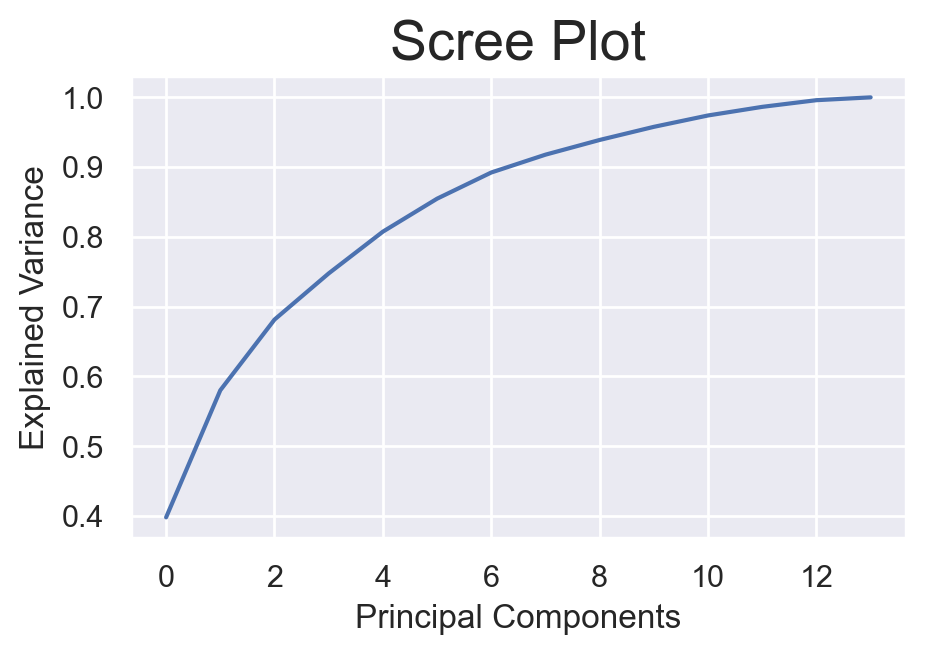

In [22]:
plt.figure(figsize=(5,3),dpi=200)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Principal Components')
plt.ylabel('Explained Variance')
plt.title('Scree Plot', size = 20)

In [23]:
pca = PCA(n_components=3)
pcs = pca.fit_transform(x)
pcs

array([[-3.56196816e+00, -1.52896694e+00, -1.30557584e-01],
       [-2.54433006e+00,  3.29992583e-01, -2.04160282e+00],
       [-2.80654586e+00, -1.04222492e+00,  1.01679147e+00],
       [-3.94428663e+00, -2.79326448e+00, -1.54955554e-01],
       [-1.41586551e+00, -9.53430360e-01,  2.11709262e+00],
       [-3.31467737e+00, -2.15987637e+00, -6.03447682e-01],
       [-2.76883800e+00, -1.16001791e+00, -9.57417877e-01],
       [-2.40349271e+00, -1.69343430e+00,  2.13923950e-01],
       [-2.81956282e+00, -8.88750972e-01, -1.77911470e+00],
       [-3.01921539e+00, -7.80940913e-01, -1.00228232e+00],
       [-3.70084217e+00, -1.30750101e+00, -4.11422652e-01],
       [-2.11892156e+00, -5.94496720e-01, -1.17784148e+00],
       [-2.44752356e+00, -6.43424399e-01, -8.56288036e-01],
       [-3.71609766e+00, -1.08602601e+00, -1.19849473e+00],
       [-4.48843580e+00, -2.09514172e+00, -1.26924638e+00],
       [-2.62175728e+00, -1.73411029e+00,  2.69678242e-01],
       [-2.49498019e+00, -2.40231306e+00

In [24]:
pcs

array([[-3.56196816e+00, -1.52896694e+00, -1.30557584e-01],
       [-2.54433006e+00,  3.29992583e-01, -2.04160282e+00],
       [-2.80654586e+00, -1.04222492e+00,  1.01679147e+00],
       [-3.94428663e+00, -2.79326448e+00, -1.54955554e-01],
       [-1.41586551e+00, -9.53430360e-01,  2.11709262e+00],
       [-3.31467737e+00, -2.15987637e+00, -6.03447682e-01],
       [-2.76883800e+00, -1.16001791e+00, -9.57417877e-01],
       [-2.40349271e+00, -1.69343430e+00,  2.13923950e-01],
       [-2.81956282e+00, -8.88750972e-01, -1.77911470e+00],
       [-3.01921539e+00, -7.80940913e-01, -1.00228232e+00],
       [-3.70084217e+00, -1.30750101e+00, -4.11422652e-01],
       [-2.11892156e+00, -5.94496720e-01, -1.17784148e+00],
       [-2.44752356e+00, -6.43424399e-01, -8.56288036e-01],
       [-3.71609766e+00, -1.08602601e+00, -1.19849473e+00],
       [-4.48843580e+00, -2.09514172e+00, -1.26924638e+00],
       [-2.62175728e+00, -1.73411029e+00,  2.69678242e-01],
       [-2.49498019e+00, -2.40231306e+00

In [25]:
y = wine['Type']

In [30]:
data = pd.DataFrame(pcs, columns = ['PC1','PC2','PC3'])
data

,PC1,PC2,PC3
0,-3.561968,-1.528967,-0.130558
1,-2.544330,0.329993,-2.041603
2,-2.806546,-1.042225,1.016791
3,-3.944287,-2.793264,-0.154956
4,-1.415866,-0.953430,2.117093
...,...,...,...
173,3.575821,-2.165115,-0.378914
174,2.951568,-1.793183,0.210665
175,3.019601,-2.860911,-0.975719
176,2.739308,-2.390595,-0.562449


In [31]:
data['Class'] = y

In [32]:
data

,PC1,PC2,PC3,Class
0,-3.561968,-1.528967,-0.130558,1
1,-2.544330,0.329993,-2.041603,1
2,-2.806546,-1.042225,1.016791,1
3,-3.944287,-2.793264,-0.154956,1
4,-1.415866,-0.953430,2.117093,1
...,...,...,...,...
173,3.575821,-2.165115,-0.378914,3
174,2.951568,-1.793183,0.210665,3
175,3.019601,-2.860911,-0.975719,3
176,2.739308,-2.390595,-0.562449,3


In [33]:
data['PC1'].mean()

-1.5967252488991015e-16

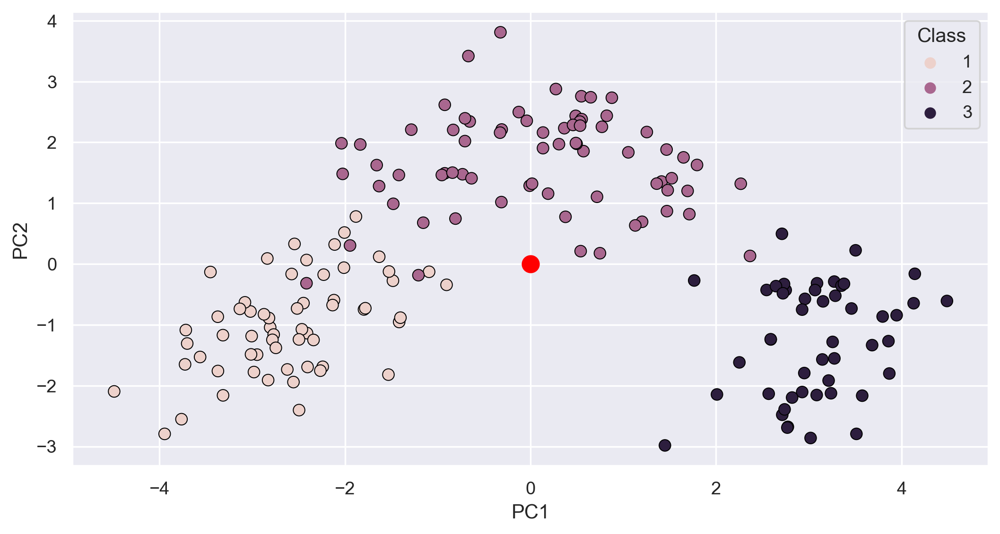

In [34]:
sns.scatterplot(x = data['PC1'], y = data['PC2'],s = 50, edgecolor = 'black',hue=data['Class'])
plt.scatter(pcs[:,0].mean(),pcs[:,1].mean(), s = 100,c = 'red')

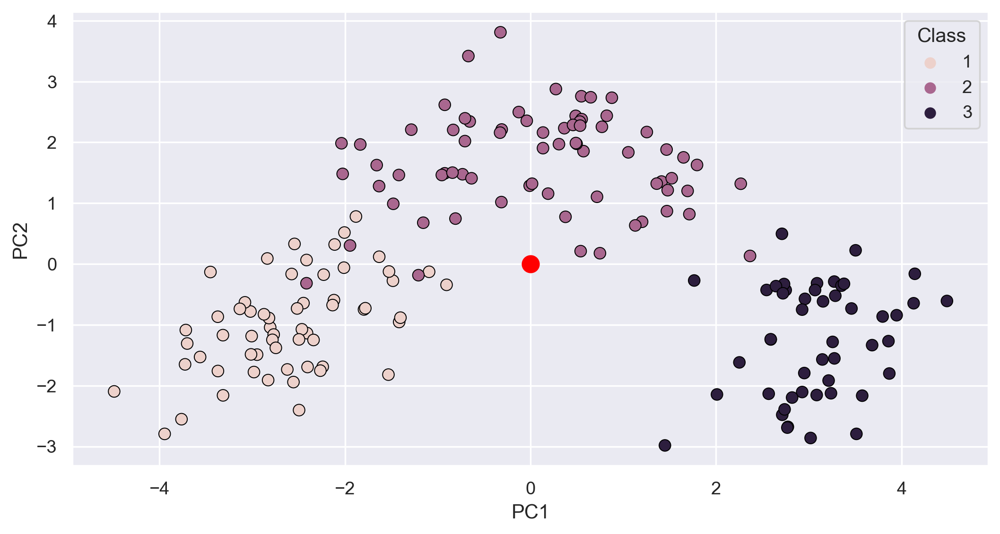

In [35]:
sns.scatterplot(x = data['PC1'], y = data['PC2'],s = 50, edgecolor = 'black',hue=data['Class'])
plt.scatter(pcs[:,0].mean(),pcs[:,1].mean(), s = 100,c = 'red')

In [36]:
data

,PC1,PC2,PC3,Class
0,-3.561968,-1.528967,-0.130558,1
1,-2.544330,0.329993,-2.041603,1
2,-2.806546,-1.042225,1.016791,1
3,-3.944287,-2.793264,-0.154956,1
4,-1.415866,-0.953430,2.117093,1
...,...,...,...,...
173,3.575821,-2.165115,-0.378914,3
174,2.951568,-1.793183,0.210665,3
175,3.019601,-2.860911,-0.975719,3
176,2.739308,-2.390595,-0.562449,3


In [37]:
x = data.iloc[:,:-1]
y = data['Class']

In [39]:
xtrain,xtest,ytrain,ytest = train_test_split(x,y,test_size=0.2, random_state=1)

### Clustering Model Building
1. Hierarchical clustering

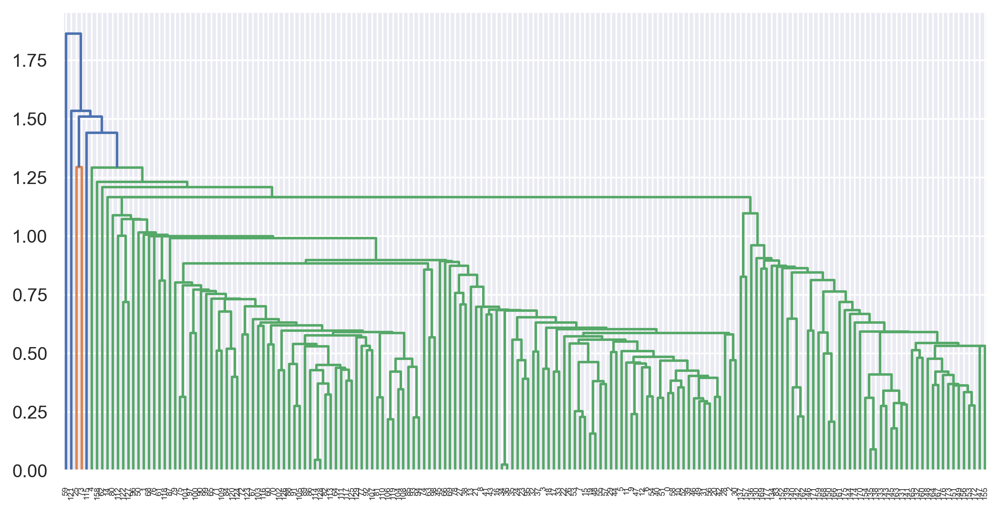

In [40]:
lk = hierarchy.linkage(x,method='single')
dendrogram = hierarchy.dendrogram(lk)

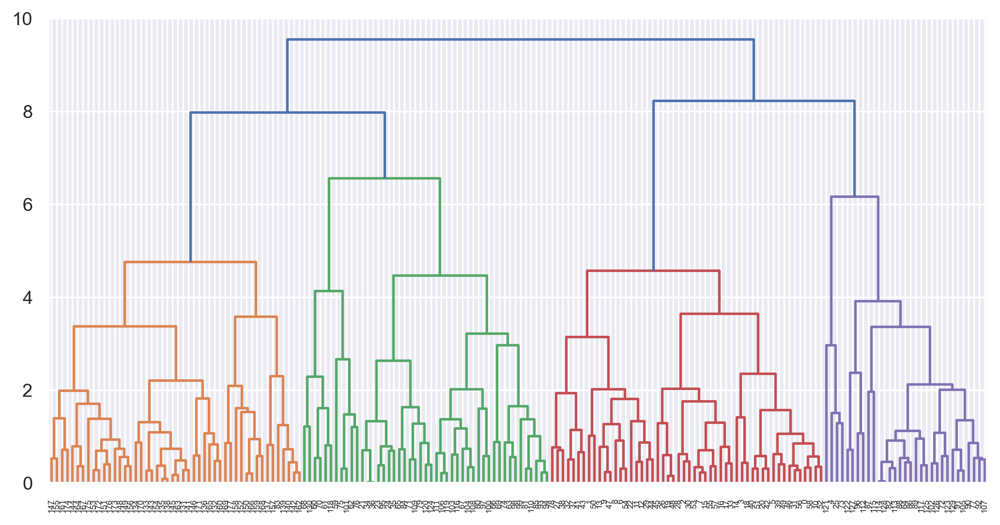

In [41]:
lk = hierarchy.linkage(x,method='complete')
dendrogram = hierarchy.dendrogram(lk)
plt.axhline(y = 25, c = 'red', linestyle = '--')

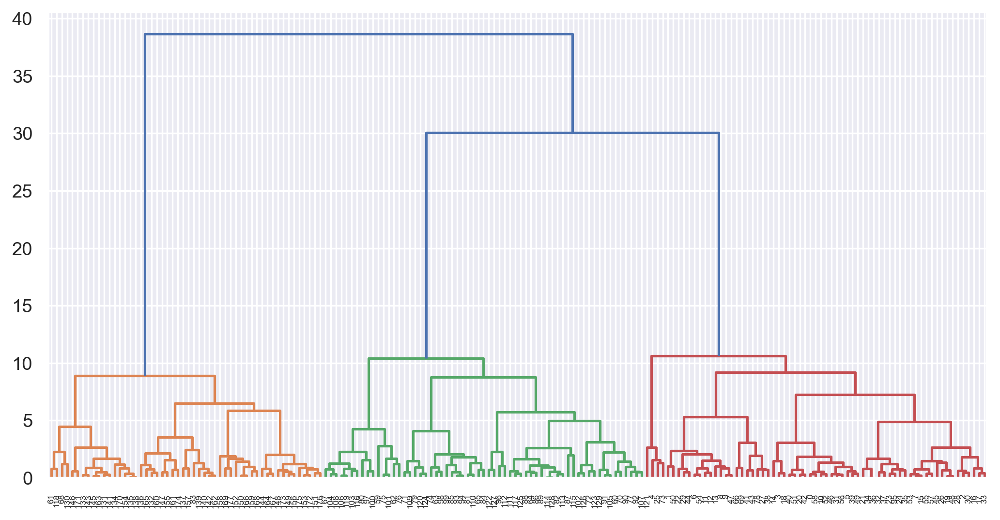

In [43]:
lk = hierarchy.linkage(x,method='ward')
dendrogram = hierarchy.dendrogram(lk)

In [45]:
hc = AgglomerativeClustering(n_clusters=2)

y_predicted = hc.fit_predict(x)

In [46]:
y_predicted

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1], dtype=int64)

In [48]:
data['Cluster'] = y_predicted
data

,PC1,PC2,PC3,Class,Cluster
0,-3.561968,-1.528967,-0.130558,1,0
1,-2.544330,0.329993,-2.041603,1,0
2,-2.806546,-1.042225,1.016791,1,0
3,-3.944287,-2.793264,-0.154956,1,0
4,-1.415866,-0.953430,2.117093,1,0
...,...,...,...,...,...
173,3.575821,-2.165115,-0.378914,3,1
174,2.951568,-1.793183,0.210665,3,1
175,3.019601,-2.860911,-0.975719,3,1
176,2.739308,-2.390595,-0.562449,3,1


In [49]:
data.groupby('Cluster').agg('mean')

,PC1,PC2,PC3,Class
Cluster,,,,
0,-1.228718,0.457700,0.104106,1.531746
1,2.977279,-1.109043,-0.252256,2.923077


<Axes: xlabel='PC1', ylabel='PC2'>

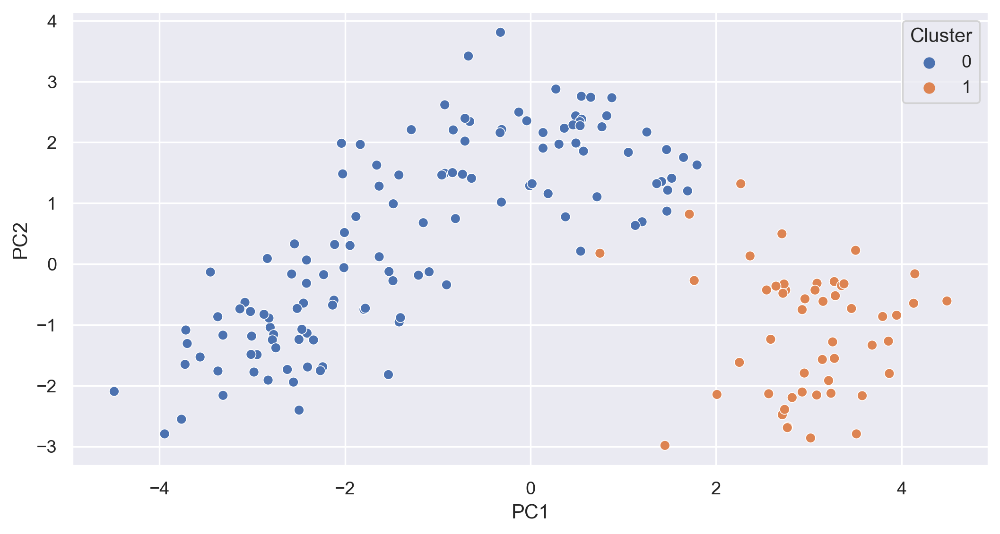

In [51]:
sns.scatterplot(x = data['PC1'], y = data['PC2'],hue = data['Cluster'])

In [52]:
data[data['Cluster'] == 0]

,PC1,PC2,PC3,Class,Cluster
0,-3.561968,-1.528967,-0.130558,1,0
1,-2.544330,0.329993,-2.041603,1,0
2,-2.806546,-1.042225,1.016791,1,0
3,-3.944287,-2.793264,-0.154956,1,0
4,-1.415866,-0.953430,2.117093,1,0
...,...,...,...,...,...
125,0.134814,2.161339,0.416292,2,0
126,0.016730,1.320074,0.671580,2,0
127,1.478888,1.213541,3.326525,2,0
128,0.489323,1.988388,1.304303,2,0


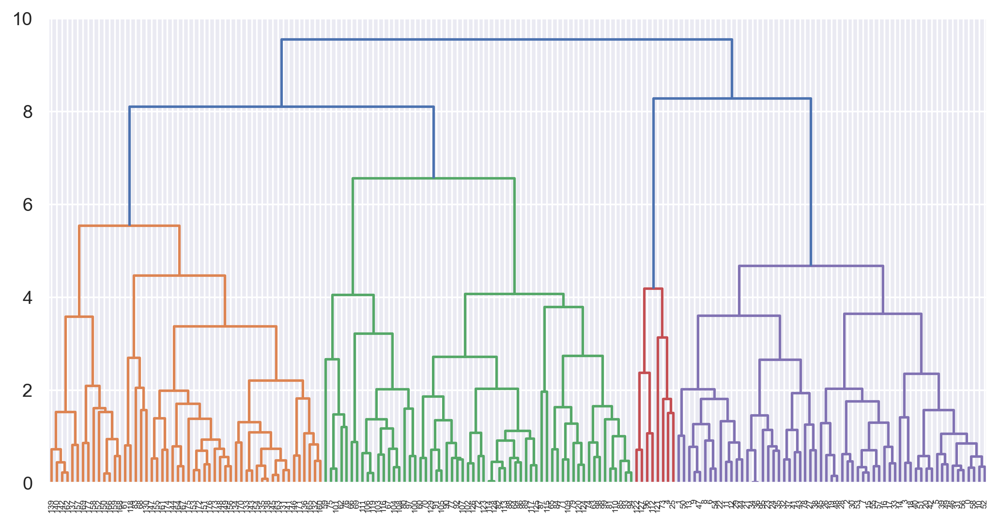

In [53]:
lk = hierarchy.linkage(data, method='complete')
dendrogram = hierarchy.dendrogram(lk)
plt.axhline(y = 20,linestyle = '--')

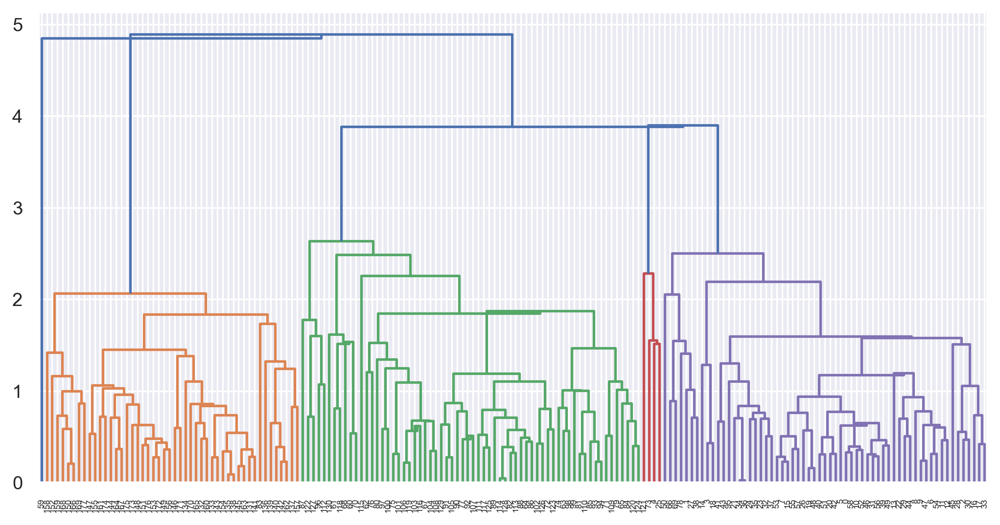

In [54]:
lk = hierarchy.linkage(data, method='centroid')
dendrogram = hierarchy.dendrogram(lk)
plt.axhline(y = 20,linestyle = '--')

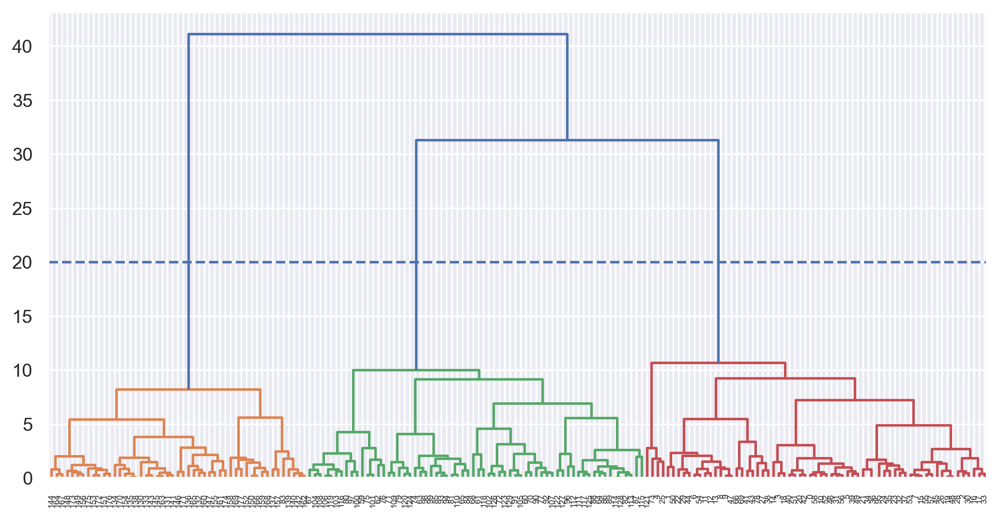

In [55]:
lk = hierarchy.linkage(data, method='ward')
dendrogram = hierarchy.dendrogram(lk)
plt.axhline(y = 20,linestyle = '--')

In [56]:
hc = AgglomerativeClustering(n_clusters=3)
y_predicted_2 = hc.fit_predict(data)
y_predicted_2

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2,
       0, 2, 2, 0, 2, 2, 2, 0, 2, 2, 2, 2, 0, 2, 2, 2, 2, 1, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1], dtype=int64)

In [57]:
data['y_predicted_2'] = y_predicted_2
data

,PC1,PC2,PC3,Class,Cluster,y_predicted_2
0,-3.561968,-1.528967,-0.130558,1,0,0
1,-2.544330,0.329993,-2.041603,1,0,0
2,-2.806546,-1.042225,1.016791,1,0,0
3,-3.944287,-2.793264,-0.154956,1,0,0
4,-1.415866,-0.953430,2.117093,1,0,0
...,...,...,...,...,...,...
173,3.575821,-2.165115,-0.378914,3,1,1
174,2.951568,-1.793183,0.210665,3,1,1
175,3.019601,-2.860911,-0.975719,3,1,1
176,2.739308,-2.390595,-0.562449,3,1,1


In [66]:
data_clustered = data

In [68]:
data_clustered['new_cluster'] = data['y_predicted_2'].replace(to_replace = {0 :1,1:2,2:3})

In [69]:
data_clustered

,PC1,PC2,PC3,Class,Cluster,y_predicted_2,new_cluster
0,-3.561968,-1.528967,-0.130558,1,0,0,1
1,-2.544330,0.329993,-2.041603,1,0,0,1
2,-2.806546,-1.042225,1.016791,1,0,0,1
3,-3.944287,-2.793264,-0.154956,1,0,0,1
4,-1.415866,-0.953430,2.117093,1,0,0,1
...,...,...,...,...,...,...,...
173,3.575821,-2.165115,-0.378914,3,1,1,2
174,2.951568,-1.793183,0.210665,3,1,1,2
175,3.019601,-2.860911,-0.975719,3,1,1,2
176,2.739308,-2.390595,-0.562449,3,1,1,2


In [70]:
data['new_cluster'].value_counts()

1    65
3    64
2    49
Name: new_cluster, dtype: int64

In [71]:
data['Class'].value_counts()

2    71
1    59
3    48
Name: Class, dtype: int64

<Axes: xlabel='PC1', ylabel='PC2'>

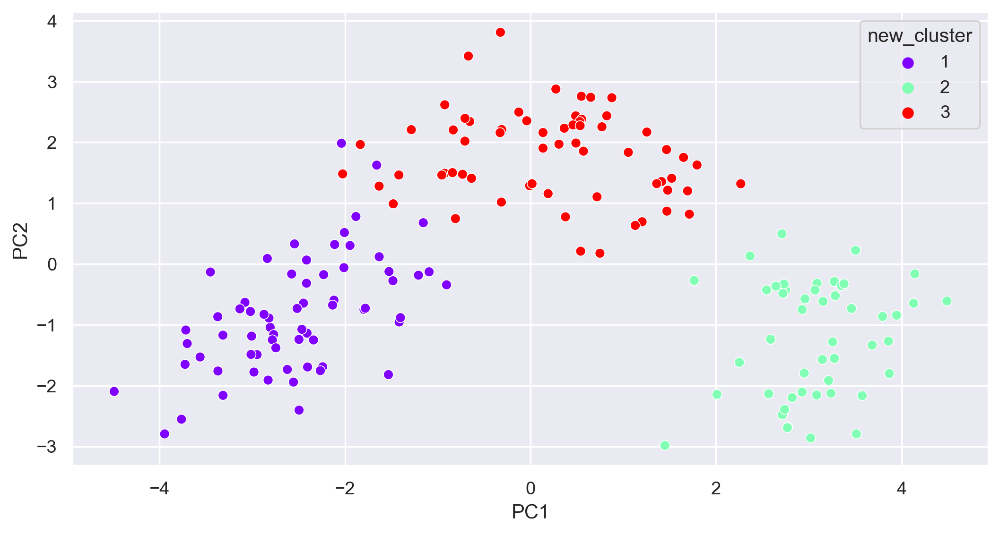

In [72]:
sns.scatterplot(x = data_clustered['PC1'] , y = data_clustered['PC2']  , hue=data_clustered['new_cluster'] , palette= 'rainbow')

<Axes: xlabel='PC2', ylabel='PC3'>

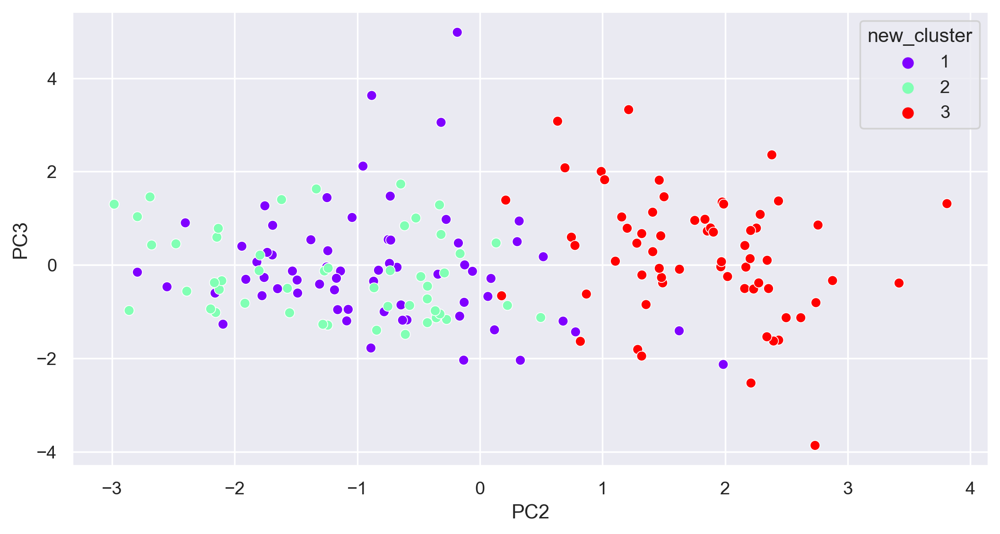

In [73]:
sns.scatterplot(x = data_clustered['PC2'],y = data_clustered['PC3'], hue = data_clustered['new_cluster'], palette='rainbow')

<Axes: xlabel='PC1', ylabel='PC3'>

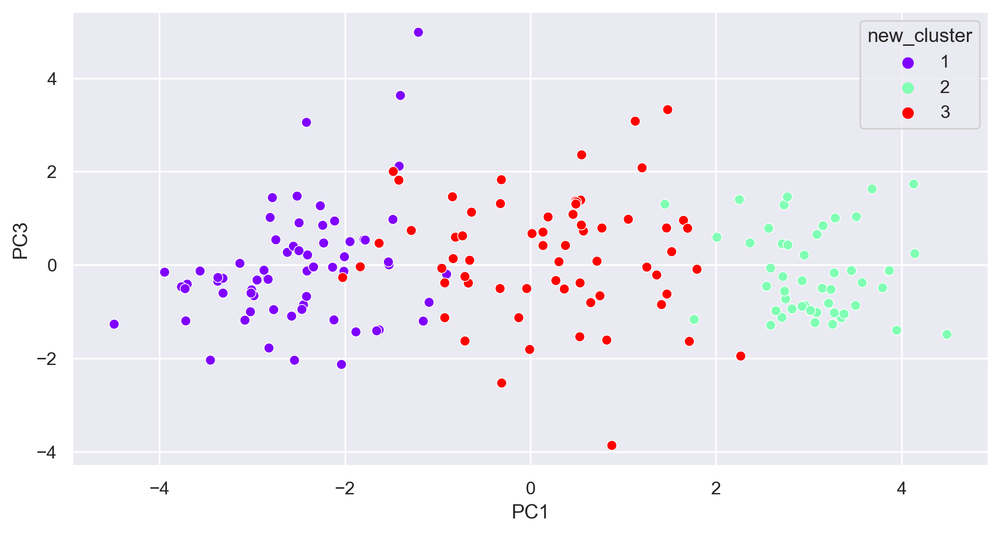

In [74]:
sns.scatterplot(x = data_clustered['PC1'],y = data_clustered['PC3'], hue = data_clustered['new_cluster'], palette='rainbow')

In [76]:
fig = pe.scatter_3d(data_clustered, x = data_clustered['PC1'], y=data_clustered['PC2'], z=data_clustered['PC3'],color = data_clustered['new_cluster'])
fig.show()

### K_mean clustering

In [83]:
x

,PC1,PC2,PC3
0,-3.561968,-1.528967,-0.130558
1,-2.544330,0.329993,-2.041603
2,-2.806546,-1.042225,1.016791
3,-3.944287,-2.793264,-0.154956
4,-1.415866,-0.953430,2.117093
...,...,...,...
173,3.575821,-2.165115,-0.378914
174,2.951568,-1.793183,0.210665
175,3.019601,-2.860911,-0.975719
176,2.739308,-2.390595,-0.562449


In [79]:
km = KMeans()
yp = km.fit_predict(x)
yp

array([0, 6, 0, 0, 5, 0, 0, 0, 6, 6, 0, 6, 6, 0, 0, 0, 0, 0, 0, 0, 0, 5,
       6, 6, 6, 5, 6, 6, 5, 6, 0, 0, 6, 0, 6, 6, 6, 6, 6, 0, 0, 6, 0, 6,
       6, 0, 0, 6, 0, 0, 6, 0, 0, 0, 6, 0, 0, 0, 0, 7, 7, 7, 7, 2, 3, 2,
       2, 2, 7, 2, 7, 5, 3, 5, 2, 7, 7, 3, 6, 3, 2, 2, 3, 1, 2, 2, 3, 3,
       3, 3, 3, 3, 3, 2, 2, 6, 3, 2, 2, 2, 2, 7, 3, 7, 2, 3, 2, 3, 2, 5,
       2, 2, 3, 3, 3, 2, 2, 3, 7, 2, 3, 5, 3, 3, 3, 3, 3, 3, 3, 3, 1, 1,
       1, 1, 1, 1, 1, 4, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 4, 4, 4, 4, 4, 4,
       1, 4, 4, 4, 4, 4, 1, 1, 1, 1, 1, 1, 4, 1, 4, 4, 1, 1, 4, 4, 4, 4,
       4, 4])

In [80]:
len(yp)

178

In [81]:
#cluster centre
km.cluster_centers_

array([[-2.98481596, -1.55843651, -0.06294267],
       [ 3.1299958 , -0.55036326, -0.4894103 ],
       [-0.73881544,  2.12067949, -0.29311175],
       [ 0.69997674,  1.59455919,  1.06501652],
       [ 2.97385024, -2.12266896,  0.23022828],
       [-1.6673369 , -0.11125889,  2.50668189],
       [-2.15905994, -0.18733007, -0.60562934],
       [ 0.9246193 ,  1.66281695, -1.62551446]])

In [82]:
pd.DataFrame(km.cluster_centers_)

,0,1,2
0,-2.984816,-1.558437,-0.062943
1,3.129996,-0.550363,-0.489410
2,-0.738815,2.120679,-0.293112
3,0.699977,1.594559,1.065017
4,2.973850,-2.122669,0.230228
5,-1.667337,-0.111259,2.506682
6,-2.159060,-0.187330,-0.605629
7,0.924619,1.662817,-1.625514


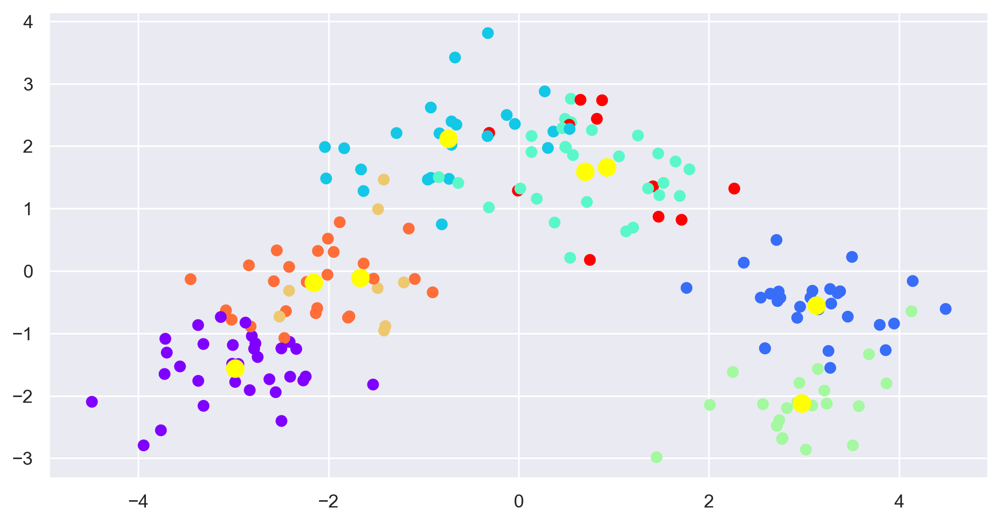

In [84]:
plt.scatter(x['PC1'],x['PC2'], c = yp, cmap='rainbow')
plt.scatter(km.cluster_centers_[:,0],km.cluster_centers_[:,1], c = 'yellow', s = 100)

In [86]:
fig = pe.scatter_3d(wine, x = x['PC1'], y=x['PC2'], z=x['PC3'])
fig.show()

In [87]:
km.inertia_

252.38650610391267

In [89]:
wcss = []

for i in range(1,20):
    km = KMeans(n_clusters=i)
    km.fit_predict(x)
    wcss.append(km.inertia_)

In [90]:
wcss

[1698.2893970423584,
 931.9694103227356,
 489.5389767484353,
 405.33393990580237,
 355.75079333933223,
 311.1829745759525,
 280.1256574279337,
 253.83145589782325,
 235.05276962694484,
 213.19986891182532,
 196.30150907713346,
 179.84464192059346,
 163.86628336336088,
 153.46681932599196,
 143.10448019857841,
 132.54882786932157,
 122.74298781603078,
 114.817967175714,
 113.38063593536522]

Text(0.5, 1.0, 'Elbow Graph')

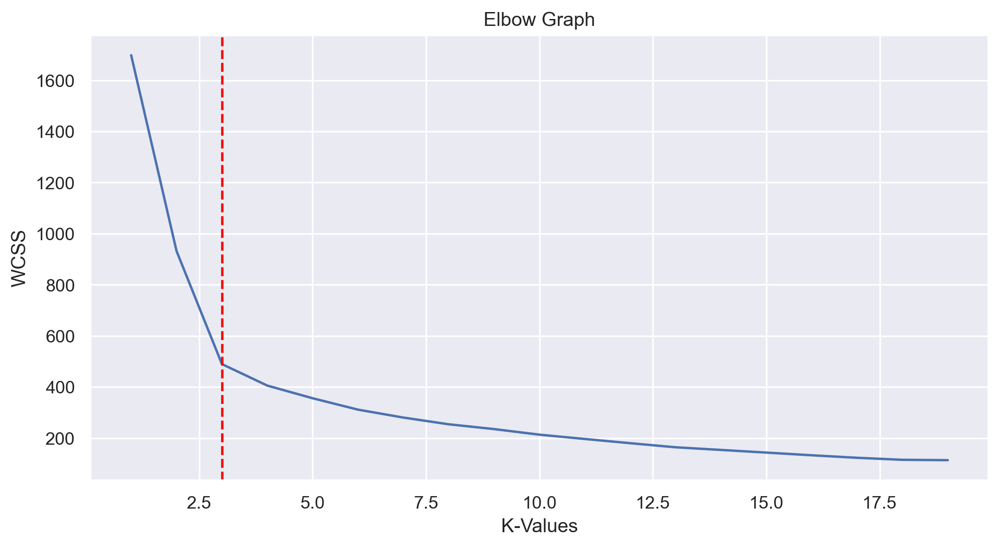

In [93]:
plt.plot(range(1,20),wcss)
plt.axvline(x = 3, linestyle = '--', color = 'red')
plt.xlabel('K-Values')
plt.ylabel('WCSS')
plt.title('Elbow Graph')

In [94]:
km = KMeans(n_clusters=3)
ypred = km.fit_predict(x)
ypred

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2])

In [95]:
km.cluster_centers_

array([[ 0.1296125 ,  1.76956464,  0.12814111],
       [-2.56088346, -0.9447518 ,  0.00456838],
       [ 3.06307627, -1.22420856, -0.18099376]])

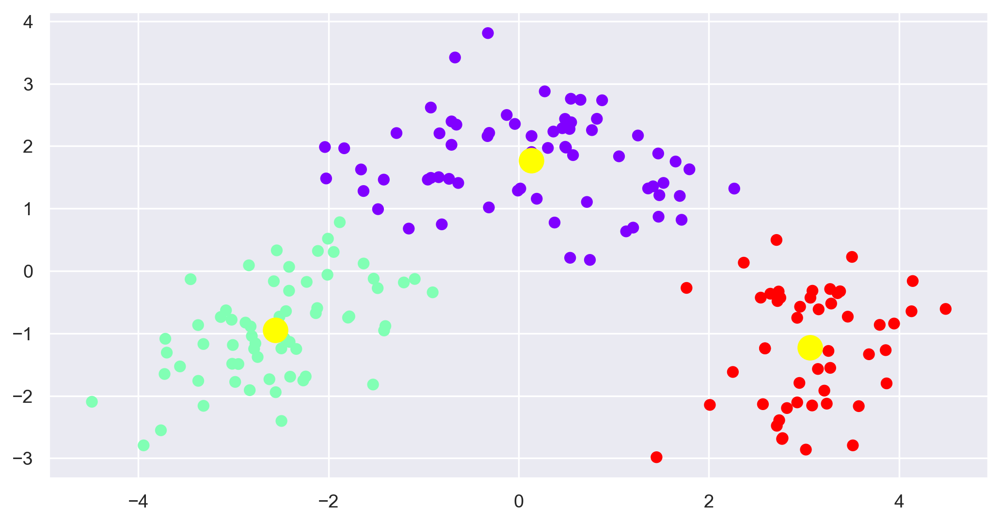

In [96]:
plt.scatter(x['PC1'],x['PC2'], c = ypred, cmap='rainbow')
plt.scatter(km.cluster_centers_[:,0],km.cluster_centers_[:,1], c = 'yellow',s = 200)

In [97]:
silhouette_score(x,ypred)

0.48739408263671946

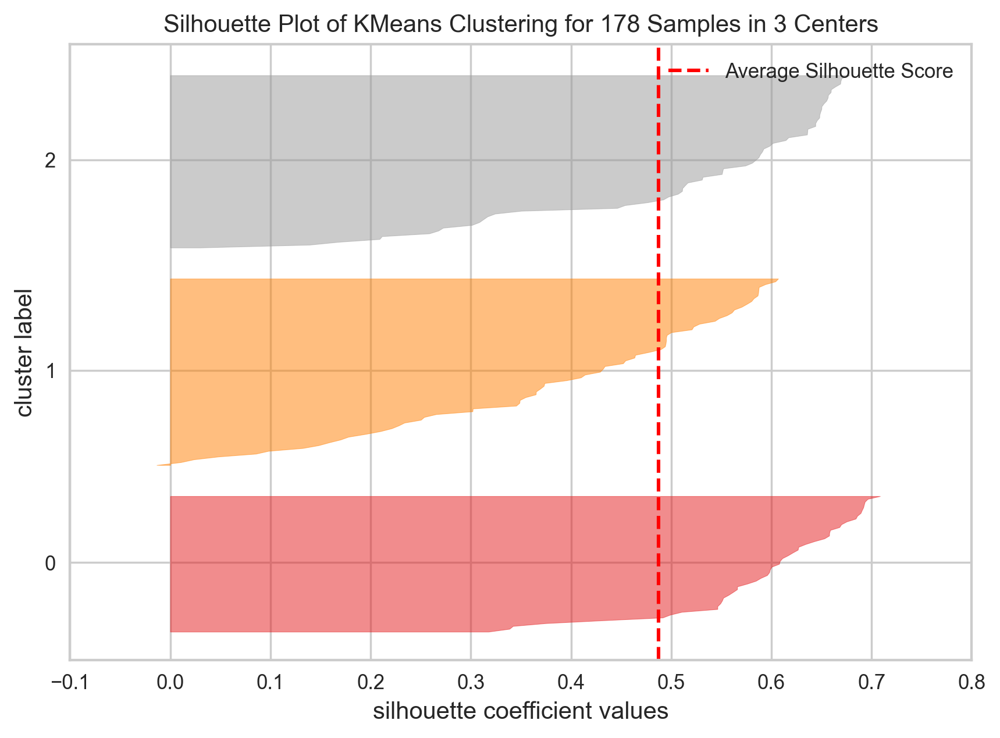

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 178 Samples in 3 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [99]:
from yellowbrick.cluster import SilhouetteVisualizer
model = SilhouetteVisualizer(KMeans(n_clusters=3))
vis = model.fit(x)
vis.show()

In [100]:
sil_score = []

for i in range(2,20):
    km = KMeans(n_clusters=i)
    y = km.fit_predict(x)
    sil_score.append(silhouette_score(x,y))

In [101]:
sil_score

[0.4180915682227794,
 0.48739408263671946,
 0.4350259367124612,
 0.37555101585899825,
 0.31511881260306235,
 0.31257512768728996,
 0.29645634176815583,
 0.29247682051876006,
 0.30244292148275465,
 0.28094122786461034,
 0.2831489792352028,
 0.29804765883602774,
 0.30620578086544303,
 0.2935184492512504,
 0.31591281006241406,
 0.32397077445402467,
 0.3114716704373081,
 0.2876047038281509]

In [102]:
#Analyzing clusters
x['cluster_k'] = ypred
x

,PC1,PC2,PC3,cluster_k
0,-3.561968,-1.528967,-0.130558,1
1,-2.544330,0.329993,-2.041603,1
2,-2.806546,-1.042225,1.016791,1
3,-3.944287,-2.793264,-0.154956,1
4,-1.415866,-0.953430,2.117093,1
...,...,...,...,...
173,3.575821,-2.165115,-0.378914,2
174,2.951568,-1.793183,0.210665,2
175,3.019601,-2.860911,-0.975719,2
176,2.739308,-2.390595,-0.562449,2


In [103]:
x.groupby('cluster_k').agg('mean')

,PC1,PC2,PC3
cluster_k,,,
0,0.129612,1.769565,0.128141
1,-2.560883,-0.944752,0.004568
2,3.063076,-1.224209,-0.180994


In [104]:
x['cluster_k'].value_counts()

0    67
1    62
2    49
Name: cluster_k, dtype: int64

In [105]:
wine['Type'].value_counts()

2    71
1    59
3    48
Name: Type, dtype: int64

## Inferances
from comparision of actual type and clusters obvtained by using algorithms , k means is better for the given data set as it giving more accurate results than hierarchical clustering